In [1]:
%matplotlib inline
import sys
sys.path.append('./')
import matplotlib.pyplot as plt

In [2]:
import yj_layout

In [3]:
import networkx as nx

In [4]:
# https://blog.dominodatalab.com/social-network-analysis-with-networkx/
G_fb = nx.read_edgelist("./facebook_combined.txt", create_using = nx.Graph(), nodetype = int)
print nx.info(G_fb)

Name: 
Type: Graph
Number of nodes: 4039
Number of edges: 88234
Average degree:  43.6910


In [5]:
spos = nx.spring_layout(G_fb)

/usr/lib/python2.7/dist-packages/scipy/sparse/coo.py:200: VisibleDeprecationWarning: `rank` is deprecated; use the `ndim` attribute or function instead. To find the rank of a matrix see `numpy.linalg.matrix_rank`.
  if np.rank(self.data) != 1 or np.rank(self.row) != 1 or np.rank(self.col) != 1:
/usr/lib/python2.7/dist-packages/scipy/sparse/compressed.py:130: VisibleDeprecationWarning: `rank` is deprecated; use the `ndim` attribute or function instead. To find the rank of a matrix see `numpy.linalg.matrix_rank`.
  if np.rank(self.data) != 1 or np.rank(self.indices) != 1 or np.rank(self.indptr) != 1:
/usr/lib/python2.7/dist-packages/scipy/sparse/sputils.py:141: VisibleDeprecationWarning: `rank` is deprecated; use the `ndim` attribute or function instead. To find the rank of a matrix see `numpy.linalg.matrix_rank`.
  if np.rank(M) == 0 and np.rank(N) == 0:


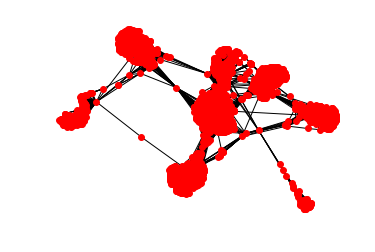

In [17]:
plt.axis("off")
nx.draw_networkx(G_fb,pos=spos,with_labels = False, node_size = 35)
plt.show()

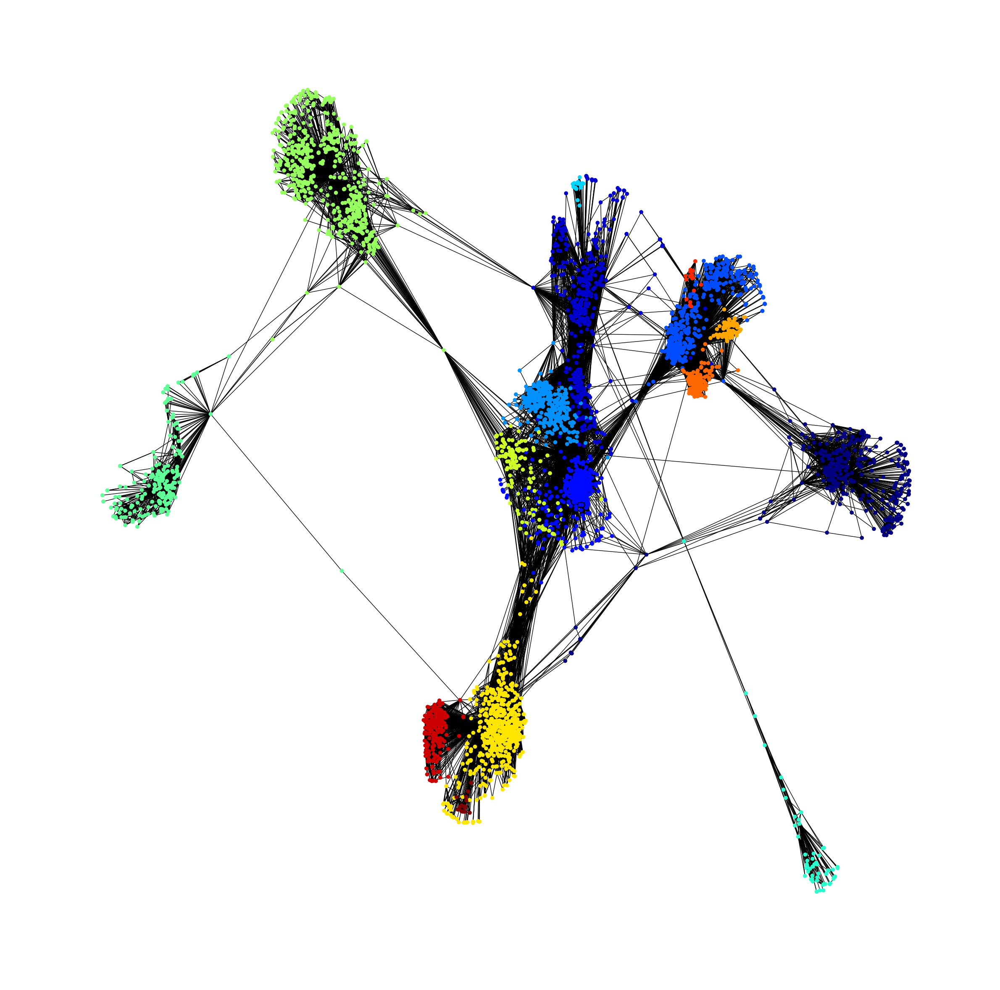

In [25]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
plt.figure(1, figsize=(30, 30))
import community
parts = community.best_partition(G_fb)
values = [parts.get(node) for node in G_fb.nodes()]
plt.axis("off")
nx.draw_networkx(G_fb, pos = spos, cmap = plt.get_cmap("jet"), node_color = values, node_size = 35, with_labels = False)


In [33]:
from multiprocessing import Pool
import itertools

def partitions(nodes, n):
    "Partitions the nodes into n subsets"
    nodes_iter = iter(nodes)
    while True:
        partition = tuple(itertools.islice(nodes_iter,n))
        if not partition:
            return
        yield partition

def btwn_pool(G_tuple):
    return nx.betweenness_centrality_source(*G_tuple)

def between_parallel(G, processes = None):
    p = Pool(processes=processes)
    part_generator = 4*len(p._pool)
    node_partitions = list(partitions(G.nodes(), int(len(G)/part_generator)))
    num_partitions = len(node_partitions)
 
    bet_map = p.map(btwn_pool,
                        zip([G]*num_partitions,
                        [True]*num_partitions,
                        [None]*num_partitions,
                        node_partitions))
 
    bt_c = bet_map[0]
    for bt in bet_map[1:]:
        for n in bt:
            bt_c[n] += bt[n]
    return bt_c

bt = between_parallel(G_fb)
top = 10

max_nodes =  sorted(bt.iteritems(), key = lambda v: -v[1])[:top]
bt_values = [5]*len(G_fb.nodes())
bt_colors = [0]*len(G_fb.nodes())
for max_key, max_val in max_nodes:
    bt_values[max_key] = 150
    bt_colors[max_key] = 2

plt.axis("off")
nx.draw_networkx(G_fb, pos = spring_pos, cmap = plt.get_cmap("rainbow"), node_color = bt_colors, node_size = bt_values, with_labels = False)

OSError: [Errno 12] Cannot allocate memory

In [21]:
element, pos, size = yj_layout.YJlayout(G_fb)

100%|██████████| 4039/4039 [00:00<00:00, 34430.20it/s]


In [31]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
plt.figure(1, figsize=(100, 100))
import community
parts = community.best_partition(G_fb)
values = [parts.get(node) for node in G_fb.nodes()]
plt.axis("off")

#nx.draw_networkx(G_fb, pos = pos, cmap = plt.get_cmap("jet"),node_color = values, node_size = 35, with_labels = False)
nx.draw_networkx_nodes(G_fb, pos=pos,alpha= 1,node_size=size,node_color=values,cmap=plt.get_cmap("jet"))
nx.draw_networkx_edges(G_fb,pos=pos,alpha=0.1,edge_color='gray')